In [1]:
import cv2 as cv
import h5py
import math
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import openslide
import pandas as pd
import random
from PIL import Image

import os

In [2]:
# Paths to raw TMA files.
PATH_TO_RAW_DATA = "/deep/group/aihc-bootcamp-fall2021/lymphoma/raw"
PATH_TO_IMAGES = os.path.join(PATH_TO_RAW_DATA, "svs")

# Path to processed data (extracted TMA patches)
PATH_TO_PROCESSED_DATA = "/deep/group/aihc-bootcamp-fall2021/lymphoma/processed"
PATH_TO_TMA_PATCHES = os.path.join(PATH_TO_PROCESSED_DATA, "tma_patches")

# Path to annotations and labels (diagnoses)
PATH_TO_ANNOTATIONS_CSV = os.path.join(PATH_TO_RAW_DATA, "cores")
PATH_TO_DIAGNOSES = os.path.join(PATH_TO_RAW_DATA, "core_labels.csv")

In [3]:
# ID of TMA being processed
TMA_ID = 6

# Path to generated annotations file from *_annotations.qpdata files
PATH_TO_TMA_ANNOTATION = os.path.join(PATH_TO_ANNOTATIONS_CSV, "TMA6B_annotations.csv")

# Path to *TMA*.svs
PATH_TO_TMA_IMAGE = os.path.join(PATH_TO_IMAGES, "1010906_TMA6B.svs")

In [4]:
tma = openslide.OpenSlide(PATH_TO_TMA_IMAGE)
tma_annotations = pd.read_csv(PATH_TO_TMA_ANNOTATION)
tma_annotations.head()

,Name,X,Y,Width,Height
0,E0850B,49174.0,37725.0,3032.0,3032.0
1,E0867A,45448.0,29136.0,3032.0,3032.0
2,E0829B,2632.0,47955.0,3031.0,3031.0
3,E0870B,24608.0,28378.0,2779.0,2779.0
4,E0921B,21577.0,6907.0,3031.0,3031.0


In [17]:
tma_case_to_diagnosis = pd.read_csv(PATH_TO_DIAGNOSES)
tma_case_to_diagnosis.head()

,Unnamed: 0,TMA ID,CASE,2017 WHO DIAGNOSIS,CLPA Diagnostic Bin,label
0,0,1,E0001 B,NOT ON TMA,Excluded,-1
1,1,1,E0002 B,NON-DIAGNOSTIC,Excluded,-1
2,2,1,E0003 B,Classic Hodgkin Lymphoma,HL,1
3,3,1,E0004 B,"Follicular lymphoma, grade 1-2",FL,3
4,4,1,E0005 B,"Diffuse large B cell lymphoma, NOS",DLBCL,0


In [18]:
# Taken from DLBCL-Morph: extracting_roi_tma.ipynb.
# Takes in a patch (PIL image) and returns whether or not the patch is sufficiently non-white.
def is_patch_nonwhite_first(patch):
    PERCENT_WHITE_PIXELS_THRESHOLD = 0.95
    SAT_THRESHOLD = 0.05

    hsv_patch = matplotlib.colors.rgb_to_hsv(patch)
    saturation = hsv_patch[:,:,1]
    percent = np.mean(saturation < SAT_THRESHOLD)
    return percent <= PERCENT_WHITE_PIXELS_THRESHOLD

# Taken from DLBCL-Morph: extracting_roi_tma.ipynb.
# Takes in a patch (PIL image) and returns whether or not the patch is sufficiently non-white.
def is_patch_nonwhite_second(patch):
    GRAD_ZERO_THRESHOLD = 500
    gray = cv.cvtColor(np.array(patch), cv.COLOR_RGB2GRAY)
    sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=5)
    sobely = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=5)
    mag = np.abs(sobelx) + np.abs(sobely)
    return np.sum(mag == 0) <= GRAD_ZERO_THRESHOLD

# Extracts (default: 224 x 224) patches from a single core in the passed-in TMA.
# The tissue core is defined by: top-left: (xs, ys), bottom-right: (xe, ye).
# Only patches that are sufficiently non-white are returned.
# Returns an np.array of dimension: n x 224 x 224 x 3 (where n = # of returned patches)
def get_patches_from_core(tma, xs, ys, xe, ye, patch_size=224):
    patches = []
    for y in range(ys, ye, patch_size):
        for x in range(xs, xe, patch_size):
            patch = tma.read_region([x, y], 0, [patch_size, patch_size]).convert('RGB')
            if is_patch_nonwhite_first(patch) and is_patch_nonwhite_second(patch):
                patches.append(np.array(patch))
                
    if len(patches) == 0:
        return np.array([])
    return np.stack(patches)

In [26]:
CASE = "CASE"
WHO_DIAGNOSIS = "2017 WHO DIAGNOSIS"
CLPA_DIAGNOSIS = "CLPA Diagnostic Bin"
LABEL = "label"

def get_field_by_patient_id(tma_id, patient_id, field):
    missing_ids = set(["placenta", "tonsil"])
    
    add_b_ids = set(["E0184", "E0147", "E0137"])
    add_a_ids = set(["E0307"])
    
    if patient_id in missing_ids:
        print(f"Could not find {field} for: {patient_id}")
        return None
    elif patient_id in add_b_ids:
        patient_id += " B"
    elif patient_id in add_a_ids:
        patient_id += " A"
    elif not patient_id.rstrip()[-2].isspace() and patient_id.rstrip()[-1].isalpha():  # Add space between alphabet and number: "E0456B" -> "E0456 B"
        patient_id = patient_id[:-1] + " " + patient_id[-1]
    
    condition = (tma_case_to_diagnosis[CASE] == patient_id) & (tma_case_to_diagnosis["TMA ID"] == tma_id)
    
    if len(tma_case_to_diagnosis[condition][field].values) == 0:
        print(f"Could not find {field} for: {patient_id}")
        return None
    
    return tma_case_to_diagnosis[condition][field].values[0]

print(get_field_by_patient_id(1, "E0090 C", WHO_DIAGNOSIS))
print(get_field_by_patient_id(4, "E0456 B", WHO_DIAGNOSIS))

NON-DIAGNOSTIC
Diffuse large B cell lymphoma, non-germinal center type


In [27]:
def tma_to_hdf5_file(tma_id, tma_annotations, tma_slide):
    tma_hdf5_filename = f'tma{tma_id}.hdf5'
    if os.path.exists(tma_hdf5_filename):
        os.remove(tma_hdf5_filename)
    f = h5py.File(tma_hdf5_filename, "w")
    patient_ids = set()
    
    patient_id_repeats = {}
    
    for index, row in tma_annotations.iterrows():
        patient_id = row["Name"]
        
        if not isinstance(patient_id, str):
            continue
        
        name = patient_id
        
        who_diagnosis = get_field_by_patient_id(tma_id, patient_id, WHO_DIAGNOSIS)
        clpa_diagnosis = get_field_by_patient_id(tma_id, patient_id, CLPA_DIAGNOSIS)
        label = get_field_by_patient_id(tma_id, patient_id, LABEL)
        
        if who_diagnosis == None:
            continue
        
        # Deal with duplicate patients
        if (patient_id not in patient_ids):
            patient_id_repeats[patient_id] = 0

        patient_id_repeats[patient_id] += 1
        name += f"_v{patient_id_repeats[patient_id]}"
            
        xs, ys, width, height = int(row["X"]), int(row["Y"]), int(row["Width"]), int(row["Height"])
        xe, ye = xs + width, ys + height
        patches = get_patches_from_core(tma_slide, xs, ys, xe, ye)
        
        if patches.size == 0:
            print(f"No patches found for TMA: {tma_id}, Patient: {patient_id}")
            continue
        
        dset = f.create_dataset(name, data=patches, dtype='uint8')
        dset.attrs['tma_id'] = tma_id
        dset.attrs['patient_id'] = patient_id
        dset.attrs['who_diagnosis'] = who_diagnosis
        dset.attrs['clpa_diagnosis'] = clpa_diagnosis
        dset.attrs['label'] = label
        patient_ids.add(patient_id)
        
    f.close()
    
tma_to_hdf5_file(TMA_ID, tma_annotations, tma)

Could not find 2017 WHO DIAGNOSIS for: placenta
Could not find CLPA Diagnostic Bin for: placenta
Could not find label for: placenta
Could not find 2017 WHO DIAGNOSIS for: E0184 B
Could not find CLPA Diagnostic Bin for: E0184 B
Could not find label for: E0184 B
No patches found for TMA: 6, Patient: E0919B
No patches found for TMA: 6, Patient: E0839B
No patches found for TMA: 6, Patient: E0907B
No patches found for TMA: 6, Patient: E0926B
Could not find 2017 WHO DIAGNOSIS for: placenta
Could not find CLPA Diagnostic Bin for: placenta
Could not find label for: placenta
No patches found for TMA: 6, Patient: E0926B
Could not find 2017 WHO DIAGNOSIS for: tonsil
Could not find CLPA Diagnostic Bin for: tonsil
Could not find label for: tonsil
Could not find 2017 WHO DIAGNOSIS for: E0137 B
Could not find CLPA Diagnostic Bin for: E0137 B
Could not find label for: E0137 B
No patches found for TMA: 6, Patient: E0925B
Could not find 2017 WHO DIAGNOSIS for: E0184 B
Could not find CLPA Diagnostic Bin 

In [11]:
def get_patches_by_patient_id(tma_name, patient_id):
    tma_hdf5_filename = os.path.join(PATH_TO_TMA_PATCHES, f"{tma_name}.hdf5")
    f = h5py.File(tma_hdf5_filename, "r")
    patient_id_key = patient_id + "_v1"
    if patient_id_key not in f:
        f.close()
        assert(f"Patient ID: {patient_id} not in {tma_name}")
    dset = f[patient_id_key]
    print("Patient ID: ", patient_id)
    print("WHO Diagnosis: ", dset.attrs['who_diagnosis'])
    print("CLPA Diagnosis: ", dset.attrs['clpa_diagnosis'])
    print("Label: ", dset.attrs['label'])
    patches_array = np.zeros(dset.shape, dtype='uint8')
    dset.read_direct(patches_array)
    f.close()
    return patches_array

def get_random_patch(patches_array):
    i = random.randint(0, patches_array.shape[0])
    patch = patches_array[i,:]
    return Image.fromarray(patch)

def show_patches(patches_array, num_samples=None):
    n = patches_array.shape[0]
    if num_samples != None:
        n = min(n, num_samples)
    for i in range(n):
        plt.imshow(patches_array[i])
        plt.show()

Patient ID:  E0003 B
WHO Diagnosis:  Classic Hodgkin Lymphoma
CLPA Diagnosis:  HL
Label:  1
Number of patches extracted:  121


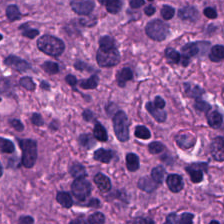

In [12]:
# Extract patches for patient ID: E0003 B.

patches_array = get_patches_by_patient_id("tma1", "E0003 B")
print("Number of patches extracted: ", len(patches_array))
image = get_random_patch(patches_array)
image

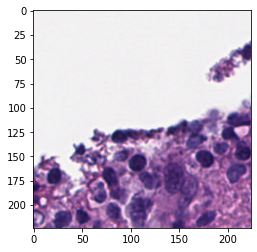

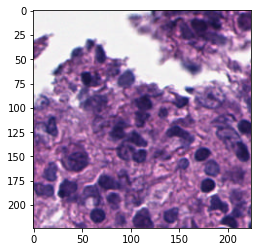

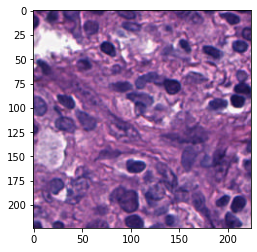

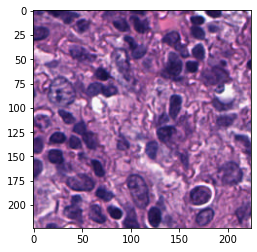

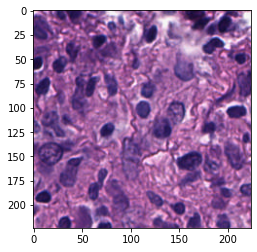

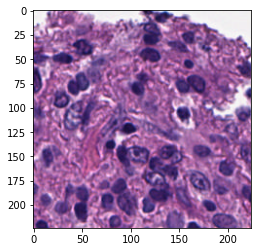

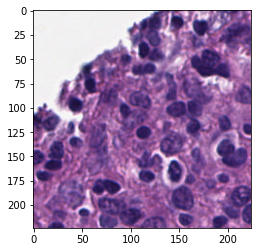

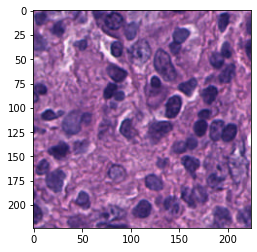

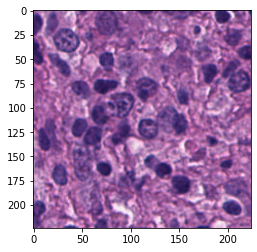

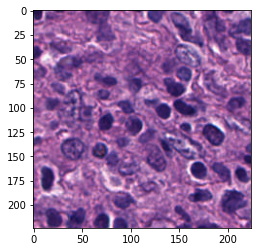

In [13]:
show_patches(patches_array, num_samples=10)

## Testing

In [8]:
# These values are obtained from 1010900_TMA1_annotated.qpdata.
xs = 13046
ys = 6695
width = 2699
height = 2813

xe = xs + width
ye = ys + height

In [9]:
PATH_TO_TMA_IMAGE = os.path.join(PATH_TO_IMAGES, "1010900_TMA1.svs")
tma = openslide.OpenSlide(PATH_TO_TMA_IMAGE)
patch = tma.read_region([xs, ys], 0, [width, height]).convert('RGB')

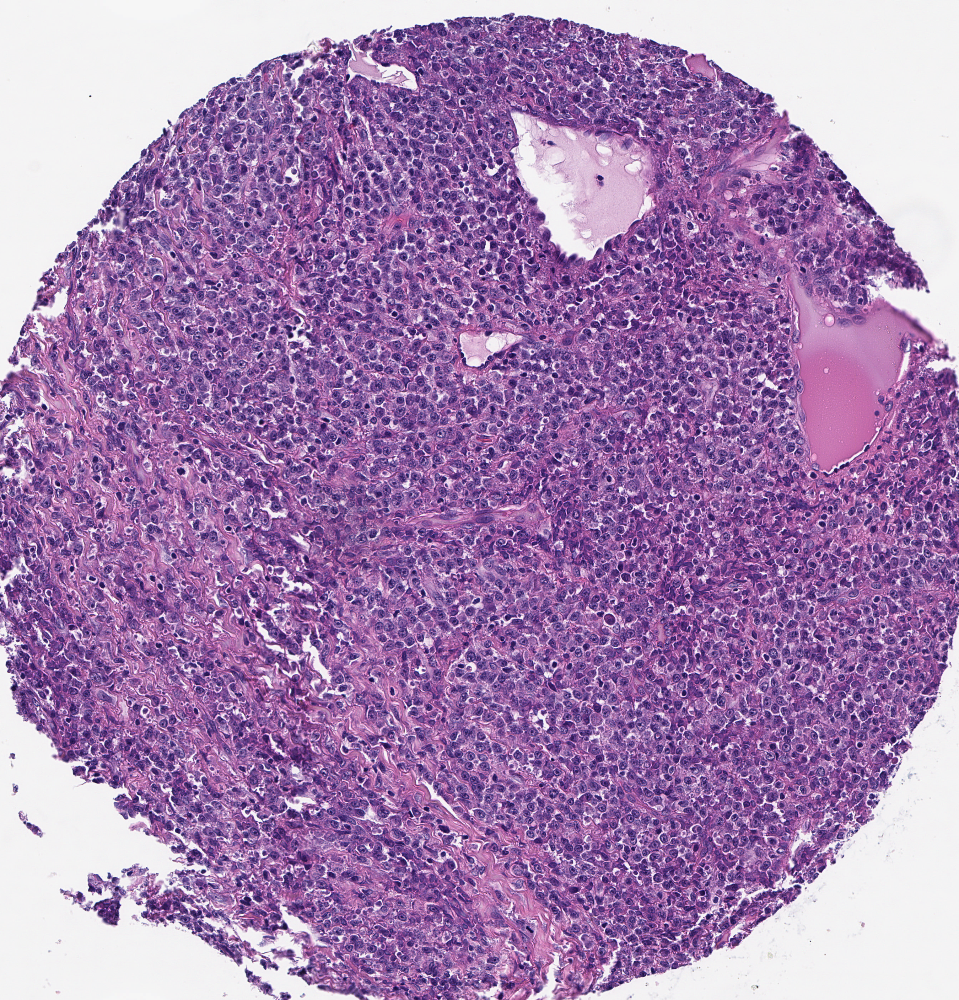

In [10]:
patch

In [11]:
patches = get_patches_from_core(tma, xs, ys, xe, ye)
num_patches = len(patches)
print(f"Number of patches extracted: {num_patches}")

Number of patches extracted: 108


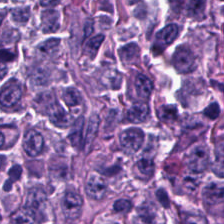

In [12]:
patch = patches[0,:]
image = Image.fromarray(patch)
image